In [1]:
import os
import sys
import re
import numpy as np
import tensorflow as tf
import pandas as pd
import cv2
import glob
import json
import matplotlib.pyplot as plt

from collections import deque
from predictors.posepredictor import PosePredictor
seed = 1

In [2]:
with open("image_data_table.json") as image_talbe_file:
    image_data_table = json.load(image_talbe_file)

In [3]:
downsample_factor = 3
n_frames = 32
train_test_split = 0.7

In [4]:
X_train, y_train, X_test, y_test = [], [], [], []
for dataset in image_data_table["datasets"]:
    for user in dataset["users"]:
        for date in dataset["dates"]:
            for action in dataset["actions"]:
                files_path = os.path.join(
                    dataset["location"],
                    dataset["version_num"],
                    "pose",
                    user,
                    date,
                    action
                )
                times = glob.glob(os.path.join(files_path,"*"))
                for time in times:
                    time_stamp = os.path.split(time)[-1]
                    files = glob.glob(os.path.join(time,'*.csv'))
                    # create the pose deques
                    train_deque_list = []
                    for i in range(downsample_factor):
                        train_deque_list.append(deque(maxlen=n_frames))

                    # print(files)
                    for j in range(0, int(train_test_split * len(files))):
                        # load and predict on image
                        #print(file)
                        current_pose = np.genfromtxt(files[j], delimiter=",")
                        # deque index
                        index = int(j % downsample_factor)
                        # add to pose deque
                        train_deque_list[index].append(current_pose)
                        # if the deque is full then add it to the X and y
                        #print(deque_list[index])
                        if len(train_deque_list[index]) == n_frames:
                            # add file to the data lists for exploration
                            X_train.append(np.array(train_deque_list[index]))
                            y_train.append(action)
                    
                    # create the pose deques
                    test_deque_list = []
                    for i in range(downsample_factor):
                        test_deque_list.append(deque(maxlen=n_frames))

                    # print(files)
                    for j in range(int(train_test_split * len(files)), len(files)):
                        # load and predict on image
                        #print(file)
                        current_pose = np.genfromtxt(files[j], delimiter=",")
                        # deque index
                        index = int(j % downsample_factor)
                        # add to pose deque
                        test_deque_list[index].append(current_pose)
                        # if the deque is full then add it to the X and y
                        #print(deque_list[index])
                        if len(test_deque_list[index]) == n_frames:
                            # add file to the data lists for exploration
                            X_test.append(np.array(test_deque_list[index]))
                            y_test.append(action)

In [5]:
X_train = np.array(X_train)
print("X_train shape", X_train.shape)
y_train = np.array(y_train)
print("y_train shape", y_train.shape)
X_test = np.array(X_test)
print("X_test shape", X_test.shape)
y_test = np.array(y_test)
print("y_test shape", y_test.shape)

print(
    "train X ((min, min), (max, max)): ((",
    X_train[:,:,:,0].min(),", ", X_train[:,:,:,1].min(), "), (",
    X_train[:,:,:,0].max(),", ", X_train[:,:,:,1].max(), "))"
)

X_train shape (1635, 32, 17, 2)
y_train shape (1635,)
X_test shape (435, 32, 17, 2)
y_test shape (435,)
train X ((min, min), (max, max)): (( 0.6663004062518999 ,  54.58317738098857 ), ( 505.493158125228 ,  642.0337267330185 ))


In [6]:
y_df = pd.DataFrame(y_train)
y_df[0].value_counts()

star_jumps    327
rest          327
squats        327
punching      327
ROTS          327
Name: 0, dtype: int64

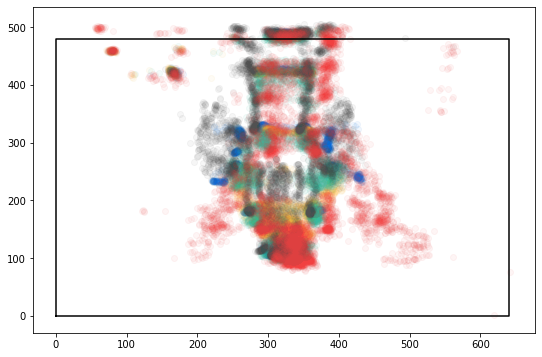

In [7]:
color_dic = {
    "rest": "#046DE0",
    "punching": "#FDBE3D",
    "ROTS": "#38B99E",
    "squats": "#515151",
    "star_jumps": "#f14040",
}
fig, ax = plt.subplots(1,1)
fig.set_size_inches((9,6))
data = X_train
for i in range(0, len(data), int(len(data)/50)):
    action = y_train[i]
    plt.scatter(data[i][:,:,1], data[i][:,:,0], c=color_dic[action], alpha=0.05 )
# ax.set_xlim((0, 640))
# ax.set_ylim((-1.1 * 48/64, 1.1* 48/64))

# draw box
ax.plot([0,0,640,640,0],[0, 480, 480, 0, 0], c='k');

In [8]:
# rescale and flip upright
image_size = np.array([480, 640])
X_train_scaled = ((X_train - 0) / (image_size.max() ))
X_test_scaled = ((X_test - 0) / (image_size.max() ))

#flip vertically
X_train_flipped = np.array(X_train_scaled)
X_train_flipped[:,:,:,0] = image_size[0]/image_size[1] - X_train_flipped[:,:,:,0]

X_test_flipped = np.array(X_test_scaled)
X_test_flipped[:,:,:,0] = image_size[0]/image_size[1] - X_test_flipped[:,:,:,0]


print(
    "train X ((min, min), (max, max)): ((",
    X_train_flipped[:,:,:,0].min(),", ", X_train_flipped[:,:,:,1].min(), "), (",
    X_train_flipped[:,:,:,0].max(),", ", X_train_flipped[:,:,:,1].max(), "))"
)

train X ((min, min), (max, max)): (( -0.03983305957066874 ,  0.08528621465779465 ), ( 0.7489589056152314 ,  1.0031776980203415 ))


In [10]:
def preprocess_ndarray(user_array: np.ndarray, image_size=np.array([480, 640])):
    user_array_scaled = ((user_array - 0) / (image_size.max() ))
    user_array_flipped = np.array(user_array_scaled)
    user_array_flipped[:,:,:,0] = image_size[0]/image_size[1] - user_array_flipped[:,:,:,0]

    def clip_dataset(data: np.ndarray, im_size=(480, 640)) -> np.ndarray:
        low_inds_y = data[:,:,:,0] < 0
        low_inds_x = data[:,:,:,1] < 0
        high_inds_y = data[:,:,:,0] > im_size[0] / (im_size[1])
        high_inds_x = data[:,:,:,1] > 1
        data[low_inds_y, :] = 0
        data[low_inds_x, :] = 0
        data[high_inds_y, :] = 0
        data[high_inds_x, :] = 0
        return data
    user_array_clipped = clip_dataset(user_array_flipped,(480, 640))

    return user_array_clipped

In [11]:
def clip_dataset(data: np.ndarray, image_size=(480, 640)) -> np.ndarray:
    low_inds_y = data[:,:,:,0] < 0
    low_inds_x = data[:,:,:,1] < 0
    high_inds_y = data[:,:,:,0] > image_size[0] / (image_size[1])
    high_inds_x = data[:,:,:,1] > 1
    data[low_inds_y, :] = 0
    data[low_inds_x, :] = 0
    data[high_inds_y, :] = 0
    data[high_inds_x, :] = 0
    return data

In [12]:
X_train_flipped = clip_dataset(X_train_flipped)
X_test_flipped = clip_dataset(X_test_flipped)

print(
    "train X ((min, min), (max, max)): ((",
    X_train_flipped[:,:,:,0].min(),", ", X_train_flipped[:,:,:,1].min(), "), (",
    X_train_flipped[:,:,:,0].max(),", ", X_train_flipped[:,:,:,1].max(), "))"
)

train X ((min, min), (max, max)): (( 0.0 ,  0.0 ), ( 0.7489589056152314 ,  0.9686795783877837 ))


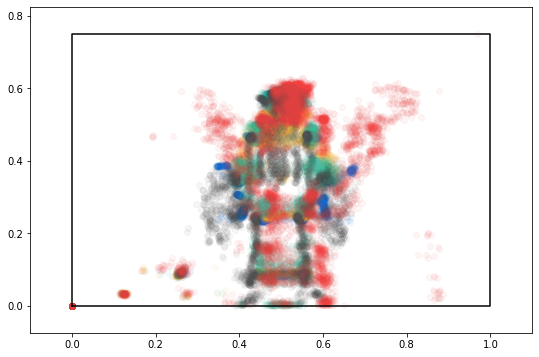

In [13]:
color_dic = {
    "rest": "#046DE0",
    "punching": "#FDBE3D",
    "ROTS": "#38B99E",
    "squats": "#515151",
    "star_jumps": "#f14040",
}
fig, ax = plt.subplots(1,1)
fig.set_size_inches((9,6))
data = X_train_flipped
for i in range(0, len(data), int(len(data)/50)):
    action = y_train[i]
    plt.scatter(data[i][:,:,1], data[i][:,:,0], c=color_dic[action], alpha=0.05 )
ax.set_xlim((-0.1,1.1))
ax.set_ylim((-0.1 * 48/64, 1.1* 48/64))

# draw box
ax.plot([0,0,1,1,0],[0, 0.75, 0.75, 0, 0], c='k');

In [14]:
# Data augementation functions

def translate_x(data: np.ndarray, dx):
    # pose points come in (y,x) pairs
    v = np.array([0, dx])
    temp = data + v
    return temp

def translate_y(data: np.ndarray, dy):
    # pose points come in (y,x) pairs
    v = np.array([dy, 0])
    temp = data + v
    return temp

def rotate_theta(data: np.ndarray, center, deg):
    # theta is the angle in degrees rotated ccw
    # pose points come in (y,x) pairs
    data = data - np.array(center)
    rot = np.array(
        [[np.cos(2 * np.pi * deg / 360), np.sin(2 * np.pi * deg / 360)],
        [-np.sin(2 * np.pi * deg / 360), np.cos(2 * np.pi * deg / 360)]]
    )
    temp = rot @ np.transpose(data, (0,2,1))
    rv = np.transpose(temp, (0,2,1)) + np.array(center)
    return rv

def reflect_horizontal(data: np.ndarray, center, flip):
    # pose points come in (y,x) pairs
    data = data - np.array(center)
    temp = np.array(data)
    if flip >= 0.5:
        temp[:,:,1] = - temp[:,:,1]
    rv = temp + np.array(center)
    return rv

def reflect_vertical(data: np.ndarray, center, flip):
    # pose points come in (y,x) pairs
    data = data - np.array(center)
    temp = np.array(data)
    if flip >= 0.5:
        temp[:,:,0] = - temp[:,:,0]
    rv = temp + np.array(center)
    return rv

def scale(data: np.ndarray, center, mag):
    data = data - np.array(center)
    temp = mag * data
    rv = temp + np.array(center)
    return rv

def test_translate_x():
    x = np.array(
        [[[1, 2], [3, 4]],
        [[5, 6], [7, 8]]]
        )
    x_translated = np.array(
        [[[1, 5], [3, 7]],
        [[5, 9], [7, 11]]]
        )
    test = translate_x(x, 3)
    assert(np.all(x_translated == test))

def test_translate_y():
    x = np.array(
        [[[1, 2], [3, 4]],
        [[5, 6], [7, 8]]]
        )
    x_translated = np.array(
        [[[5, 2], [7, 4]],
        [[9, 6], [11, 8]]]
        )
    test = translate_y(x, 4)
    assert(np.all(x_translated == test))

def test_rotate_90_degrees():
    # pose points come in (y,x) pairs
    x = np.array(
        [[[2., 3.], [4., 5.]],
        [[6., 7.], [8., 9.]]]
        )
    x_rotated = np.array(
        [[[2., -0.], [3., -2.]],
        [[7., -4.], [9., -6.]]]
        )
    test = rotate_theta(x, (1,1), 90) # 90 degrees ccw
    
    assert(np.all(x_rotated - test < 1E-6))

def test_reflect_horizontal():
    # pose points come in (y,x) pairs
    x = np.array(
        [[[2., 3.], [4., 5.]],
        [[6., 7.], [8., 9.]]]
        )
    x_reflected = np.array(
        [[[2., -1.], [4., -3.]],
        [[6., -5.], [8., -7.]]]
        )
    test = reflect_horizontal(x, (1,1), 1)
    assert(np.all(x_reflected == test))

def test_reflect_vertical():
    # pose points come in (y,x) pairs
    x = np.array(
        [[[2., 3.], [4., 5.]],
        [[6., 7.], [8., 9.]]]
        )
    x_reflected =  np.array(
        [[[-0, 3], [-2, 5]],
        [[-4, 7], [-6, 9]]]
        )
    test = reflect_vertical(x, (1,1), 1)
    
    assert(np.all(x_reflected == test))

def test_scale():
    x = np.array(
        [[[2., 3.], [4., 5.]],
        [[6., 7.], [8., 9.]]]
        )
    x_scaled = np.array(
        [[[4., 5.], [7., 9.]],
        [[11., 13.], [15., 17.]]]
        )
    test = scale(x, (1,1), 2)
    assert(np.all(x_scaled == test))

test_translate_x()
test_translate_y()
test_rotate_90_degrees()
test_reflect_horizontal()
test_reflect_vertical()

In [15]:
epochs = 40

mu_x = 0 # mean 0, 0.4*640 pixel
sig_x = 0.2 
mu_y = 0 # mean 0, 0.05*640 pixel
sig_y = 0.1
mu_rot = 0 # mean 0, std .5 deg
sig_rot = 0.5
mu_scale = 1 # mean 1, std 10%
sig_scale = 0.1

center = (image_size[0] / (2 * image_size[1]), 0.5)

X_train_augemented = []
y_train_augemented = []

# sythetic train data
data = X_train_flipped
for i in range(epochs):
    for i in range(len(data)):
        temp = data[i]
        
        low_inds_y = temp[:,:,0] <= 0
        low_inds_x = temp[:,:,1] <= 0
        high_inds_y = temp[:,:,0] >= image_size[0] / (image_size[1])
        high_inds_x = temp[:,:,1] >= 1
        
        
        x_translation_value = np.random.normal(loc=mu_x, scale=sig_x) 
        y_translation_value = np.random.normal(loc=mu_y, scale=sig_y) 
        rotation_value = np.random.normal(loc=mu_rot, scale=sig_rot) 
        h_reflection_value = np.random.uniform(0, 1)
        scale_value = np.random.normal(loc=mu_scale, scale=sig_scale) 

        temp = translate_x(temp, x_translation_value)
        temp = translate_y(temp, y_translation_value)
        temp = rotate_theta(temp, center, rotation_value)
        temp = reflect_horizontal(temp, center, h_reflection_value)
        temp = scale(temp, center, scale_value)

        temp[low_inds_y, :] = 0
        temp[low_inds_x, :] = 0
        temp[high_inds_y, :] = 0
        temp[high_inds_x, :] = 0

        X_train_augemented.append(temp)
        y_train_augemented.append(y_train[i])

X_test_augemented = []
y_test_augemented = []

# sythetic train data
data = X_test_flipped
for i in range(epochs):
    for i in range(len(data)):
        temp = data[i]

        low_inds_y = temp[:,:,0] <= 0
        low_inds_x = temp[:,:,1] <= 0
        high_inds_y = temp[:,:,0] >= image_size[0] / (image_size[1])
        high_inds_x = temp[:,:,1] >= 1

        x_translation_value = np.random.normal(loc=mu_x, scale=sig_x) # mean 0, 0.05*640 pixel
        y_translation_value = np.random.normal(loc=mu_y, scale=sig_y) # mean 0, 0.05*640 pixel
        rotation_value = np.random.normal(loc=mu_rot, scale=sig_rot) # mean 0, std .5 deg
        h_reflection_value = np.random.uniform(0, 1)
        scale_value = np.random.normal(loc=mu_scale, scale=sig_scale) # mean 1, std 10%

        temp = translate_x(temp, x_translation_value)
        temp = translate_y(temp, y_translation_value)
        temp = rotate_theta(temp, center, rotation_value)
        temp = reflect_horizontal(temp, center, h_reflection_value)
        temp = scale(temp, center, scale_value)
        
        temp[low_inds_y, :] = 0
        temp[low_inds_x, :] = 0
        temp[high_inds_y, :] = 0
        temp[high_inds_x, :] = 0

        X_test_augemented.append(temp)
        y_test_augemented.append(y_test[i])

In [16]:
X_train_augemented = np.array(X_train_augemented)
X_test_augemented = np.array(X_test_augemented)
print("train shape: ", X_train_augemented.shape)
print(
    "train X ((min, min), (max, max)): ((",
    X_train_augemented[:,:,:,0].min(),", ", X_train_augemented[:,:,:,1].min(), "), (",
    X_train_augemented[:,:,:,0].max(),", ", X_train_augemented[:,:,:,1].max(), "))"
)

train shape:  (65400, 32, 17, 2)
train X ((min, min), (max, max)): (( -0.4546355238894244 ,  -0.7787853851425477 ), ( 1.1361826334507574 ,  1.8347295367820493 ))


In [17]:
X_train_augemented = clip_dataset(X_train_augemented)
X_test_augemented = clip_dataset(X_test_augemented)
print("train shape: ", X_train_augemented.shape)
print(
    "train X ((min, min), (max, max)): ((",
    X_train_augemented[:,:,:,0].min(),", ", X_train_augemented[:,:,:,1].min(), "), (",
    X_train_augemented[:,:,:,0].max(),", ", X_train_augemented[:,:,:,1].max(), "))"
)

train shape:  (65400, 32, 17, 2)
train X ((min, min), (max, max)): (( 0.0 ,  0.0 ), ( 0.7499999023415609 ,  0.9999997920109521 ))


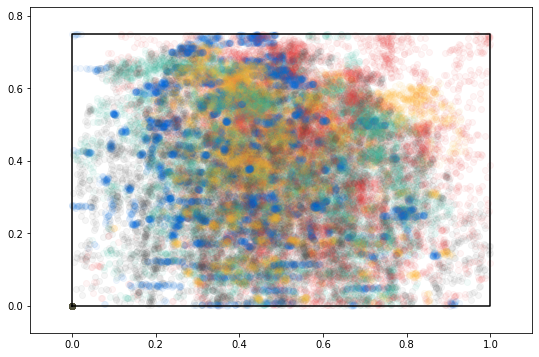

In [18]:
color_dic = {
    "rest": "#046DE0",
    "punching": "#FDBE3D",
    "ROTS": "#38B99E",
    "squats": "#515151",
    "star_jumps": "#f14040",
}
fig, ax = plt.subplots(1,1)
fig.set_size_inches((9,6))
data = X_train_augemented
for i in range(0, data.shape[0], int(data.shape[0]/100)):
    action = y_train_augemented[i]
    plt.scatter(data[i][:,:,1], data[i][:,:,0], c=color_dic[action], alpha=0.05 )
ax.set_xlim((-0.1,1.1))
ax.set_ylim((-0.1 * 48/64, 1.1* 48/64))

# draw box
ax.plot([-0,-0,1,1,-0],[-0, 0.75, 0.75, -0, -0], c='k');

((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.5838294785310323 ,  0.6252234928338909 ))
((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.5740617464952431 ,  0.6341047667343793 ))
((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.6022005452256258 ,  0.6439978529043235 ))
((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.5930345624337401 ,  0.6603957521312431 ))
((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.6271747234730405 ,  0.8791199908646166 ))


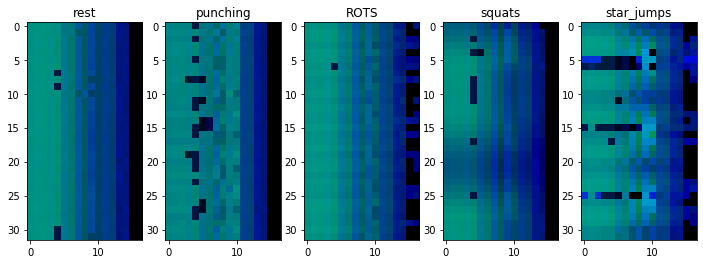

In [19]:
test_indices = [0, 350, 700, 1050, 1400]

fig, ax = plt.subplots(1, len(test_indices))
fig.set_size_inches((12,6))
for i in range(len(test_indices)):
    test_action = X_train_flipped[test_indices[i]]
    # test_action = (test_action + (image_size / (image_size.max()))) / 2
    test_image = np.zeros((32,17,3))
    test_image[:,:,1:3] = test_action
    
    #test_image =clip_image(test_image)

    #print("min: ", test_image.min(), "max :", test_image.max())
    print(
        "((min, min), (max, max)): \n((",
        test_action[:,:,0].min(),", ", test_action[:,:,1].min(), "), (",
        test_action[:,:,0].max(),", ", test_action[:,:,1].max(), "))"
    )
    
    ax[i].imshow(test_image)
    ax[i].set_title(y_train[test_indices[i]]);

((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.6372960691675605 ,  0.5922007444839673 ))
((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.48383483189745635 ,  0.8008932722725515 ))
((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.4879797483317113 ,  0.7354096390285123 ))
((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.5695520259323898 ,  0.9537100492595927 ))
((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.6093280384124327 ,  0.789912137250349 ))


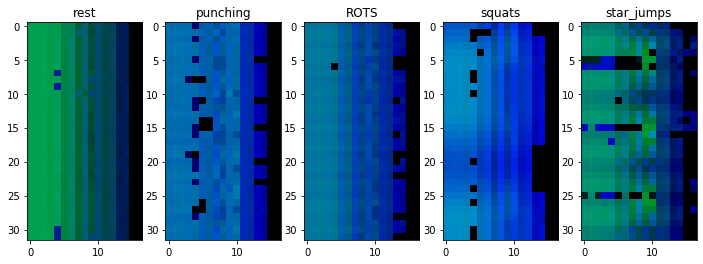

In [20]:
test_indices = [0, 350, 700, 1051, 1400]

fig, ax = plt.subplots(1, len(test_indices))
fig.set_size_inches((12,6))
for i in range(len(test_indices)):
    test_action = X_train_augemented[test_indices[i]]
    # test_action = (test_action + (image_size / (image_size.max()))) / 2
    test_image = np.zeros((32,17,3))
    test_image[:,:,1:3] = test_action

    print(
        "((min, min), (max, max)): \n((",
        test_action[:,:,0].min(),", ", test_action[:,:,1].min(), "), (",
        test_action[:,:,0].max(),", ", test_action[:,:,1].max(), "))"
    )
    
    ax[i].imshow(test_image)
    ax[i].set_title(y_train_augemented[test_indices[i]]);

((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.5835861983466242 ,  0.6161574714378625 ))
((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.5583878851818204 ,  0.860837291650735 ))
((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.6002284849664117 ,  0.6171555495911536 ))
((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.5760209662441149 ,  0.6304880737794513 ))
((min, min), (max, max)): 
(( 0.0 ,  0.0 ), ( 0.6213254817265017 ,  0.8061883681479131 ))


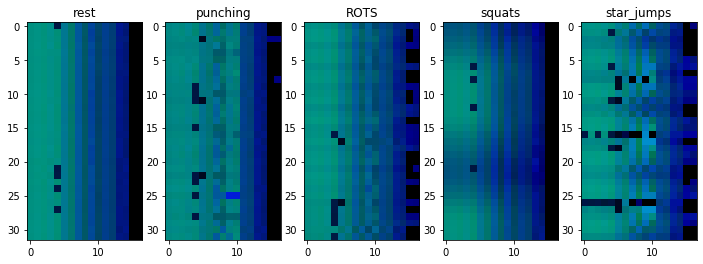

In [21]:
test_indices = [0, 100, 200, 300, 400]

fig, ax = plt.subplots(1, len(test_indices))
fig.set_size_inches((12,6))
for i in range(len(test_indices)):
    test_action = X_test_flipped[test_indices[i]]
    # test_action = (test_action + (image_size / (image_size.max()))) / 2
    test_image = np.zeros((32,17,3))
    test_image[:,:,1:3] = test_action

    print(
        "((min, min), (max, max)): \n((",
        test_action[:,:,0].min(),", ", test_action[:,:,1].min(), "), (",
        test_action[:,:,0].max(),", ", test_action[:,:,1].max(), "))"
    )
    
    ax[i].imshow(test_image)
    ax[i].set_title(y_test[test_indices[i]]);

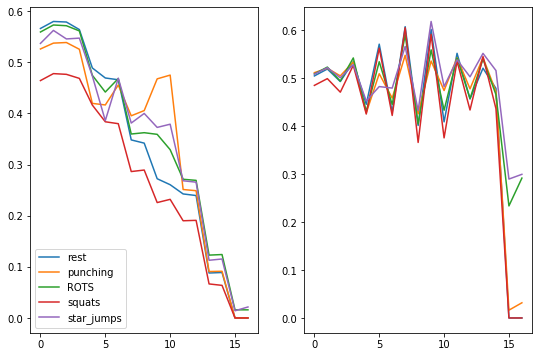

In [22]:
test_indices = [0, 100, 200, 300, 400]
fig, ax = plt.subplots(1,2)
fig.set_size_inches((9,6))
labels = []
for i in range(len(test_indices)):
    y = X_test_flipped[test_indices[i]].mean(axis=0)
    ax[0].plot(range(len(y)), y[:,0])
    ax[1].plot(range(len(y)), y[:,1])
    labels.append(y_test[test_indices[i]])
ax[0].legend(labels)

In [23]:
# create onehot encoding of y_train_augemented and y_test_augemented
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(handle_unknown='error', sparse=False)
y_train_one_hot = encoder.fit_transform(np.array(y_train_augemented).reshape((-1,1)))
y_test_one_hot = encoder.transform(np.array(y_test_augemented).reshape((-1,1)))


In [24]:
from sklearn.utils import shuffle
X_train_augemented, y_train_one_hot = shuffle(X_train_augemented, y_train_one_hot, random_state=seed)
y_train_one_hot[:10,:]

array([[1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.]])

In [25]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten

In [50]:
model = Sequential()
model.add(Flatten(input_shape=X_train_augemented.shape[1:]))

model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(rate=0.1))

model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(rate=0.1))

model.add(Dense(5))
model.add(Activation('softmax'))

model.compile(loss = 'categorical_crossentropy', optimizer= 'adam', metrics = ['accuracy'])
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_2 (Flatten)          (None, 1088)              0         
_________________________________________________________________
dense_5 (Dense)              (None, 64)                69696     
_________________________________________________________________
activation_5 (Activation)    (None, 64)                0         
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 64)                4160      
_________________________________________________________________
activation_6 (Activation)    (None, 64)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)               

In [51]:
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping
es = EarlyStopping(
    monitor='val_loss', 
    mode='min', 
    patience=100, 
    verbose=1, 
    restore_best_weights=True
    ) 

history = model.fit(X_train_augemented, y_train_one_hot, batch_size = 8192, epochs = 600, validation_split = 0.2, callbacks=[es])

al_accuracy: 0.9926
Epoch 154/600
7/7 [==============================] - 0s 51ms/step - loss: 0.0155 - accuracy: 0.9952 - val_loss: 0.0215 - val_accuracy: 0.9926
Epoch 155/600
7/7 [==============================] - 0s 50ms/step - loss: 0.0146 - accuracy: 0.9952 - val_loss: 0.0204 - val_accuracy: 0.9929
Epoch 156/600
7/7 [==============================] - 0s 52ms/step - loss: 0.0138 - accuracy: 0.9957 - val_loss: 0.0213 - val_accuracy: 0.9926
Epoch 157/600
7/7 [==============================] - 0s 47ms/step - loss: 0.0143 - accuracy: 0.9954 - val_loss: 0.0218 - val_accuracy: 0.9924
Epoch 158/600
7/7 [==============================] - 0s 43ms/step - loss: 0.0147 - accuracy: 0.9955 - val_loss: 0.0217 - val_accuracy: 0.9924
Epoch 159/600
7/7 [==============================] - 0s 43ms/step - loss: 0.0146 - accuracy: 0.9955 - val_loss: 0.0224 - val_accuracy: 0.9920
Epoch 160/600
7/7 [==============================] - 0s 47ms/step - loss: 0.0140 - accuracy: 0.9957 - val_loss: 0.0208 - val_acc

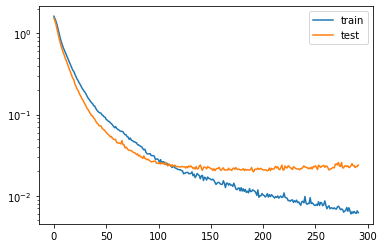

In [52]:
# plot training history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')

# baseline = 0.25252519405266327 # linear model
# plt.plot([0,1000],[baseline**2, baseline**2])

# baseline = 0.2163232816813099 # taking previous days
# plt.plot([0,1000],[baseline**2, baseline**2])

plt.legend()
plt.yscale('log')
plt.show()

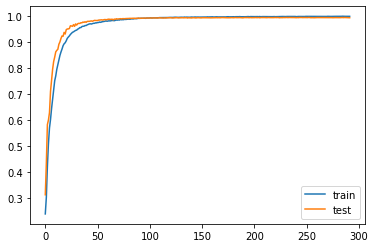

In [53]:
# plot training history
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='test')

# baseline = 0.25252519405266327 # linear model
# plt.plot([0,1000],[baseline**2, baseline**2])

# baseline = 0.2163232816813099 # taking previous days
# plt.plot([0,1000],[baseline**2, baseline**2])

plt.legend()
plt.yscale('linear')
plt.show()

In [54]:
val_loss, val_acc = model.evaluate(X_test_augemented, y_test_one_hot) # evaluate the out of sample data with model
print(val_loss) # model's loss (error)
print(val_acc) # model's accuracy

544/544 [==============================] - 0s 907us/step - loss: 0.0271 - accuracy: 0.9899
0.027102096006274223
0.9899425506591797


In [55]:
print("test accuracy: ", 
model.evaluate(X_test_flipped, encoder.transform(np.array(y_test).reshape((-1,1)))))
print("augemented test accuracy: ", model.evaluate(X_test_augemented, encoder.transform(np.array(y_test_augemented).reshape((-1,1)))))

14/14 [==============================] - 0s 1ms/step - loss: 3.2968e-04 - accuracy: 1.0000
test accuracy:  [0.00032967914012260735, 1.0]
544/544 [==============================] - 0s 891us/step - loss: 0.0271 - accuracy: 0.9899
augemented test accuracy:  [0.027102096006274223, 0.9899425506591797]


In [56]:
from sklearn.metrics import confusion_matrix

conf_mat = confusion_matrix(np.argmax(y_test_one_hot, axis=1), np.argmax(model.predict(X_test_augemented), axis=1))
conf_mat

array([[3421,   14,   14,   19,   12],
       [  19, 3443,    5,    3,   10],
       [   2,    4, 3469,    5,    0],
       [   2,    9,   31, 3437,    1],
       [   8,    8,    4,    5, 3455]], dtype=int64)

In [59]:
from sklearn.metrics import confusion_matrix

conf_mat = confusion_matrix(np.argmax(encoder.transform(np.array(y_test).reshape((-1,1))), axis=1), np.argmax(model.predict(X_test_flipped), axis=1))
conf_mat

array([[87,  0,  0,  0,  0],
       [ 0, 87,  0,  0,  0],
       [ 0,  0, 87,  0,  0],
       [ 0,  0,  0, 87,  0],
       [ 0,  0,  0,  0, 87]], dtype=int64)

In [60]:
X_test_preprocess_test = preprocess_ndarray(np.array(X_test))
y_test_preprocess_test = encoder.transform(np.array(y_test).reshape((-1,1)))
model.evaluate(X_test_preprocess_test, y_test_preprocess_test)

14/14 [==============================] - 0s 1ms/step - loss: 3.2968e-04 - accuracy: 1.0000


[0.00032967914012260735, 1.0]

In [63]:
models_path = 'models'
f_name = 'actionnet_dense_masked_model_10_fps.h5'
model_path = os.path.join(models_path,f_name)
model.save(model_path)

In [64]:
import pickle
import marshal

In [66]:
models_path = 'models'
f_name = 'actionnet_dense_masked_preprocess_and_model_10_fps.pickle'
f_path = os.path.join(models_path,f_name)

classes_list = list(encoder.categories_[0])

code_string = marshal.dumps(preprocess_ndarray.__code__)
data = {
    "preprocess_function": code_string, 
    "model_path": model_path,
    "classes_list": classes_list
}
with open(f_path, "wb") as f:
    pickle.dump(data, f)

In [ ]:
list(encoder.categories_[0])